In [9]:
!git clone https://github.com/miniponder/virtual-self-driving-car.git

fatal: destination path 'virtual-self-driving-car' already exists and is not an empty directory.


In [10]:
!ls virtual-self-driving-car/

behaviourial_cloning.ipynb  data-2    images	media	  README.md
data			    drive.py  learning	model.h5  requirements.txt


In [11]:
!ls virtual-self-driving-car/data-2

driving_log.csv  IMG


In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.models import Sequential, save_model
from tensorflow.keras.layers import Conv2D, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import mse
import albumentations as A
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

In [13]:
datadir = 'virtual-self-driving-car/data-2'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)

In [14]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_05_31_08_05_27_147.jpg,left_2025_05_31_08_05_27_147.jpg,right_2025_05_31_08_05_27_147.jpg,0.0,0.0,0.0,0.000078
1,center_2025_05_31_08_05_27_252.jpg,left_2025_05_31_08_05_27_252.jpg,right_2025_05_31_08_05_27_252.jpg,0.0,0.0,0.0,0.000078
2,center_2025_05_31_08_05_27_356.jpg,left_2025_05_31_08_05_27_356.jpg,right_2025_05_31_08_05_27_356.jpg,0.0,0.0,0.0,0.000078
3,center_2025_05_31_08_05_27_460.jpg,left_2025_05_31_08_05_27_460.jpg,right_2025_05_31_08_05_27_460.jpg,0.0,0.0,0.0,0.000079
4,center_2025_05_31_08_05_27_563.jpg,left_2025_05_31_08_05_27_563.jpg,right_2025_05_31_08_05_27_563.jpg,0.0,0.0,0.0,0.000080


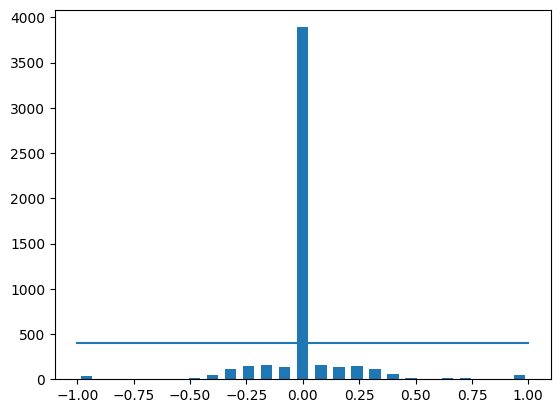

In [15]:
num_bins = 25
samples_per_bin = 400
h, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+bins[1:])/2
plt.bar(center, h, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

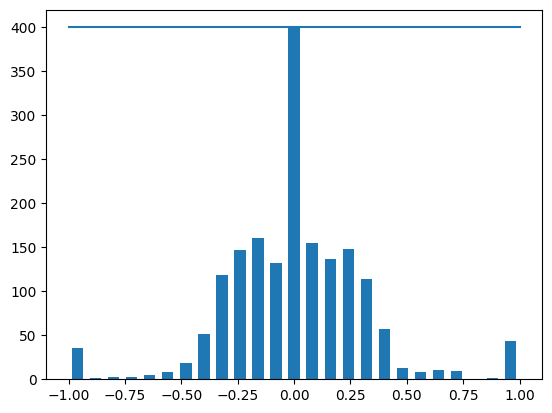

In [16]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in data.index:
    if data.loc[i, 'steering'] >= bins[j] and data.loc[i, 'steering'] <= bins[j + 1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)
data.drop(remove_list, inplace=True)
h, _ = np.histogram(data['steering'], num_bins)
plt.bar(center, h, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [17]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

<ipython-input-17-06d24e79075a>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
<ipython-input-17-06d24e79075a>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))


In [18]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

Text(0.5, 1.0, 'validation set')

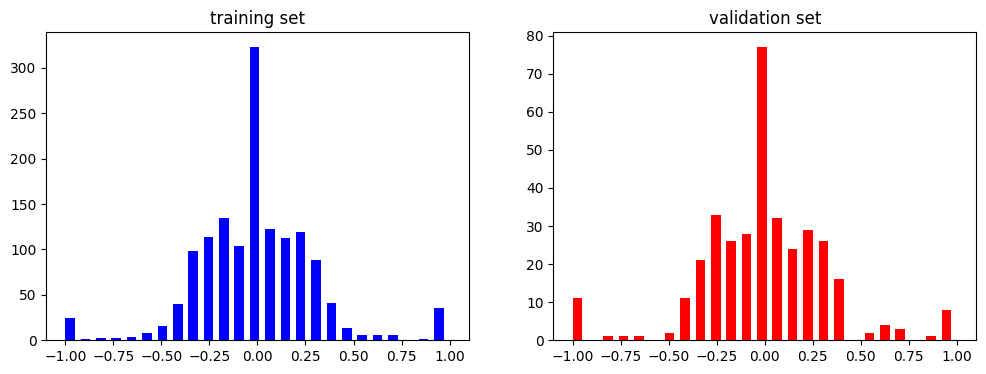

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('validation set')

In [20]:
def zoom(image):
  transform = A.Compose([
      A.Affine(scale=(1.0, 1.3))
      ])
  augmented = transform(image=image)
  return augmented['image']

Text(0.5, 1.0, 'zoomed image')

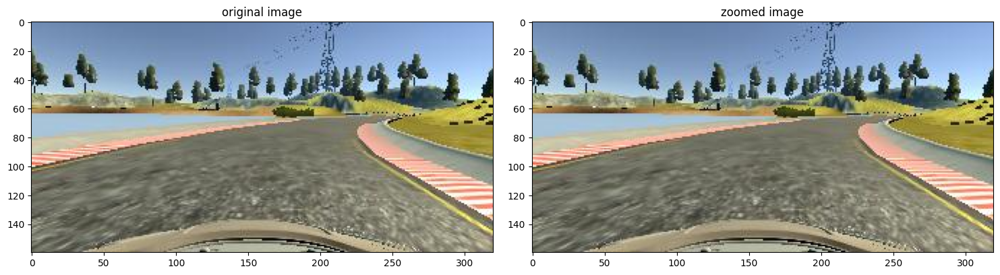

In [21]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('original image')
axes[1].imshow(zoomed_image)
axes[1].set_title('zoomed image')

In [22]:
def pan(image):
  transform = A.Affine(
      translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}
      )
  augmented = transform(image=image)
  return augmented['image']

Text(0.5, 1.0, 'panned image')

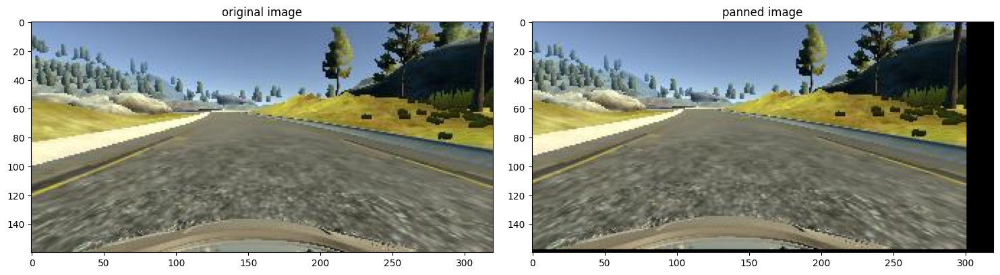

In [23]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('original image')
axes[1].imshow(panned_image)
axes[1].set_title('panned image')

In [24]:
def img_random_brightness(image):
  transform = A.RandomBrightnessContrast(
      brightness_limit=0.2,
      contrast_limit=0.2,
      p=1.0
      )
  augmented = transform(image=image)
  return augmented['image']

Text(0.5, 1.0, 'brightness altered image')

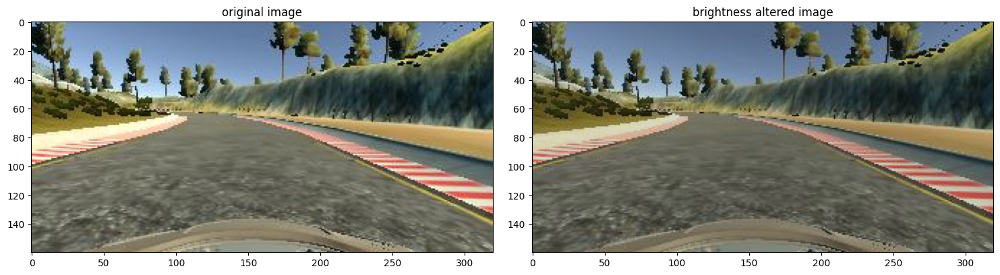

In [25]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('original image')
axes[1].imshow(brightness_altered_image)
axes[1].set_title('brightness altered image')

In [26]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'flipped image - steering angle: 0.165576')

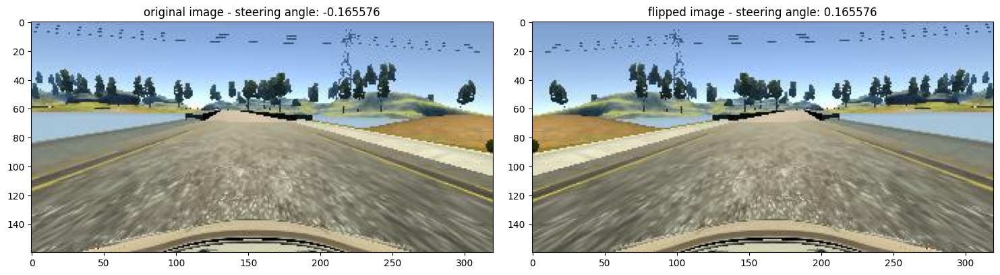

In [27]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('original image - ' + 'steering angle: ' + str(steering_angle))
axes[1].imshow(flipped_image)
axes[1].set_title('flipped image - ' + 'steering angle: ' + str(flipped_steering_angle))

In [28]:
def random_augment(image, steering_angle):
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)
  return image, steering_angle

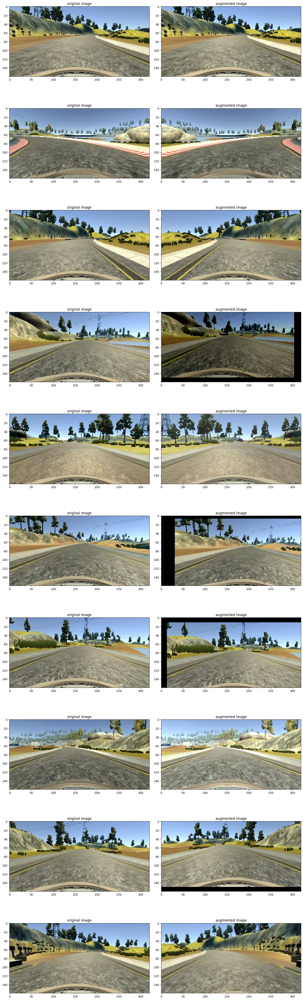

In [29]:
n_col = 2
n_row = 10
fig, axes = plt.subplots(n_row, n_col, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
  rand_index = random.randint(0, len(image_paths) -1)
  random_image = image_paths[rand_index]
  original_steering_angle = steerings[rand_index]
  original_image = mpimg.imread(random_image)
  augmented_image, augmented_steering_angle = random_augment(original_image, original_steering_angle)
  axes[i][0].imshow(original_image)
  axes[i][0].set_title('original image')
  axes[i][1].imshow(augmented_image)
  axes[i][1].set_title('augmented image')

In [30]:
def img_preprocess(img):
  img = img[60:135, :,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img, (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'preprocessed image')

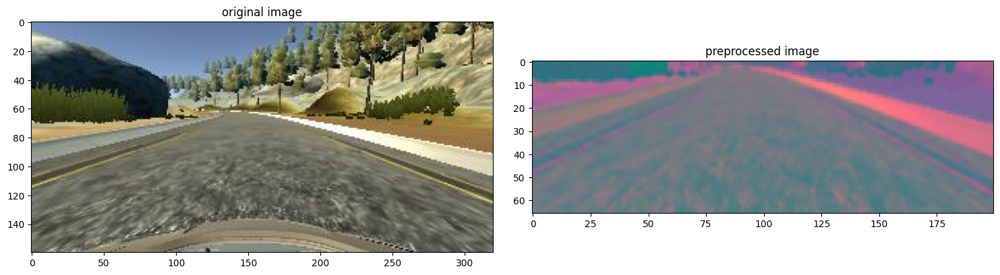

In [31]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('original image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('preprocessed image')

In [32]:
def batch_generator(image_paths, steerings, batch_size, is_training):
  while True:
    batch_img = []
    batch_steering = []
    for i in range(batch_size):
      rand_index = random.randint(0, len(image_paths) - 1)
      random_image_path = image_paths[rand_index]
      original_steering_angle = steerings[rand_index]
      original_image = mpimg.imread(random_image_path)
      if is_training:
        image, steering = random_augment(original_image, original_steering_angle)
      else:
        image = mpimg.imread(random_image_path)
        steering = original_steering_angle
      image = img_preprocess(image)
      batch_img.append(image)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'validation image')

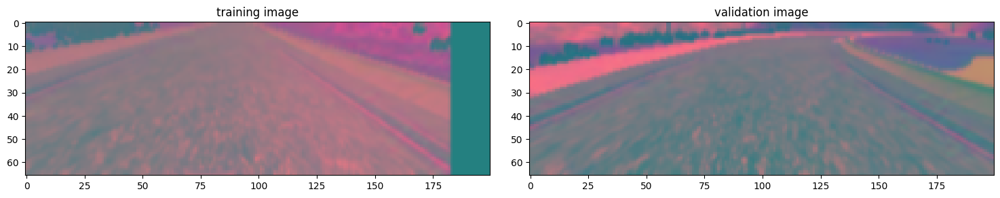

In [33]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(x_train_gen[0])
axes[0].set_title('training image')
axes[1].imshow(x_valid_gen[0])
axes[1].set_title('validation image')

In [34]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))
  model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
  model.add(Flatten())
  model.add(Dense(100, activation='elu'))
  model.add(Dense(50, activation='elu'))
  model.add(Dense(10, activation ='elu'))
  model.add(Dense(1))
  optimizer= Adam(learning_rate=1e-4)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [35]:
model = nvidia_model()
print(model.summary())

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [36]:
histo = model.fit(batch_generator(X_train, y_train, batch_size=100, is_training=1), steps_per_epoch=300, validation_data = batch_generator(X_valid,
 y_valid, batch_size=100, is_training=0), validation_steps=200, epochs=10, verbose=1, shuffle=1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 211s 694ms/step - loss: 0.0933 - val_loss: 0.0868
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 198s 662ms/step - loss: 0.0693 - val_loss: 0.0442
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 197s 658ms/step - loss: 0.0451 - val_loss: 0.0318
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 194s 647ms/step - loss: 0.0403 - val_loss: 0.0264
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 195s 650ms/step - loss: 0.0345 - val_loss: 0.0283
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 196s 656ms/step - loss: 0.0327 - val_loss: 0.0275
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 201s 672ms/step - loss: 0.0324 - val_loss: 0.0242
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 205s 683ms/step - loss: 0.0289 - val_loss: 0.0250
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 194s 648ms/step - loss: 0.0281 - val_loss: 0.0246
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 195s 650ms/step - loss: 0.0278 - val_loss: 0.0231


Text(0.5, 0, 'epoch')

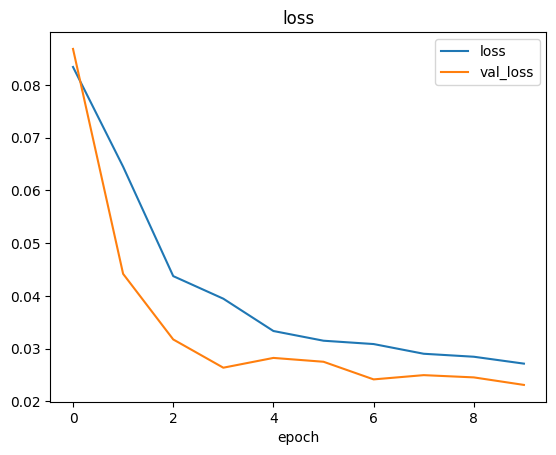

In [37]:
plt.plot(histo.history['loss'])
plt.plot(histo.history['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.title('loss')
plt.xlabel('epoch')

In [39]:
model.save('model.h5', save_format='h5')

In [40]:
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>